# <center> Housing Price Prediction </center>

# Overview:


- #### **The Data**
    - This datasets contains features for ~ 23k houses in Kings County in Seattle, Washington
    - These features include sale price, number of bed/bathrooms, living/lot square footage, condition/grade, age, and location
- #### **The Goal**
    - The end goal is to predict the sale price of a home given the other features using Linear Regression
    - The focus of this project will not be on advanced modelling techniques nor hyperparameter tuning, but instead on....
        - Handling NaNs, Duplicates, Dtypes
        - Data Cleaning
        - Exploratory Data Analysis
        - Feature Engineering
        - Understanding the output of the linear regression model for decision making

# Notebook Outline

- #### **Part 1: Cleaning and EDA**
    - Handle duplicates, NaN's, dtypes, and minimal feature engineering
    - Each feature's distribution is viewed as its relationship with our dependent variable
- #### **Part 2: Feature Engineering and EDA:**
    - Create new features from the original features
    - View distributions and relationship with dependent variable
- #### **Part 3: Modelling and Evaluation**
    - Determine which model was the most successful in prediction
    - Determine which methods were most impactful on model performance (feature engineering vs transforming etc)

##### 
##### <center>-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------</center>
##### 

# <center><u> Part 1: Data Cleaning </u></center>

### Import Packages

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import branca.colormap as cm
from scipy import stats
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
warnings.simplefilter(action='ignore')
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.model_selection import train_test_split
pd.set_option('display.float_format', lambda x: '%.4f' % x)

### Define custom functions

In [2]:
def hist_box(data, xlabel = None, title = None, font_scale=2, figsize=(9,8), bins = None, x_lim = []):
    sns.set(font_scale=font_scale)
    f2, (ax_box2, ax_hist2) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=figsize)
    sns.boxplot(data, ax=ax_box2)
    sns.distplot(data, ax=ax_hist2, bins=bins) if bins else sns.distplot(data, ax=ax_hist2)
    ax_hist2.ticklabel_format(useOffset=False, style='plain')
    if x_lim != []:
        ax_hist2.set_xlim(x_lim[0],x_lim[1])
    if xlabel: ax_hist2.set(xlabel=xlabel)
    if title: ax_box2.set(title=title)
    plt.show()

### Import Data and Inspect

In [3]:
# Import .csv file into DataFrame
df = pd.read_csv(r'kc_house_data.csv')

# Rename columns and index for interpretability
new_names = {'id':'sale_id','date':'sale_date','price':'sale_price','view':'has_been_viewed','sqft_above':'sqft_no_basement',
             'sqft_living15':'sqft_living_15_nn','sqft_lot15':'sqft_lot_15_nn'}

df.rename(columns = new_names, inplace=True)
df.index.name = 'unique_id'

# View sample of DataFrame
display(df.shape)
df.sample(2)

(21597, 21)

,sale_id,sale_date,sale_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,has_been_viewed,condition,grade,sqft_no_basement,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living_15_nn,sqft_lot_15_nn
unique_id,,,,,,,,,,,,,,,,,,,,,
1586,3303100075,10/14/2014,443500.0000,3,2.0000,1920,7598,1.0000,0.0000,0.0000,4,8,1920,0.0,1972,NaN,98177,47.7735,-122.3630,2220,7598
2551,7277100640,4/9/2015,715000.0000,3,2.5000,3050,6000,1.0000,0.0000,3.0000,3,8,1720,1330.0,1984,0.0000,98177,47.7701,-122.3890,2340,7200


# <center> ----------------------------------------------------------------------------------------------------------- </center>

# Duplicates and Missing Data

## Duplicates
- The `sale_id` column does have duplicates, but they appear to be unique sales for the same house

In [4]:
df['sale_id'].duplicated().value_counts()

False    21420
True       177
Name: sale_id, dtype: int64

In [5]:
df.duplicated().value_counts()

False    21597
dtype: int64

## Missing Data

In [6]:
df_nans = pd.DataFrame()
df_nans['Count'] = df.isna().sum()
df_nans['Percent'] = round(df.isna().mean()*100,1)
df_nans[df_nans['Count'] > 0]

,Count,Percent
waterfront,2376,11.0000
has_been_viewed,63,0.3000
yr_renovated,3842,17.8000


### The following columns are missing data
- **`waterfront`** : Missing 2376 values **(11%)**
    - This could be fixed by looking at a map view
    - On average ~ 0.05% of houses are waterfront, so that would mean hand picking only ~12 houses, the rest can be labeled 0
- **`has_been_viewed`** : Missing 63 values **(<1%)**
    - This is such a small subset its likely okay to just drop
- **`yr_renovated`** : Missing 3842 values **(17%)**
    - 96% of homes have not been renovated, so filling with 0 is likely appropriate
    - Might be a good idea testing model with it filled with 0 vs dropped
- **`sqft_basement`** : Has 454 value set to "?" **(2%)** and is the wrong dtype
    - Most houses have no basement, likely okay to fill with 0

#### Waterfront Map
- Plot houses missing `waterfront` data

In [7]:
# Get hand picked list
actually_waterfront = [3577000116,1568100920,2726049034,3761700053,825059178,7129303070,2579500110,1724069060,9201300020,573000685]

# Use list to fill with 1s, then fill the rest with 0s
df.loc[df['sale_id'].isin(actually_waterfront), 'waterfront'] = 1
df['waterfront'] = df['waterfront'].fillna(0)

In [8]:
# Fill with 0s
df['yr_renovated'] = df['yr_renovated'].fillna(0)

In [9]:
# Replace "?" with nan
df['sqft_basement'].replace("?", np.nan, inplace = True)

df['sqft_basement'] = df['sqft_basement'].astype(float)

# Drop NaNs
df = df.dropna()

# <center> ----------------------------------------------------------------------------------------------------------- </center>

# Data Cleaning & EDA

## 1) Sale Price: 
- Target/Dependent Variable
- Strong Positive Skew
- Likely need to transform for normality

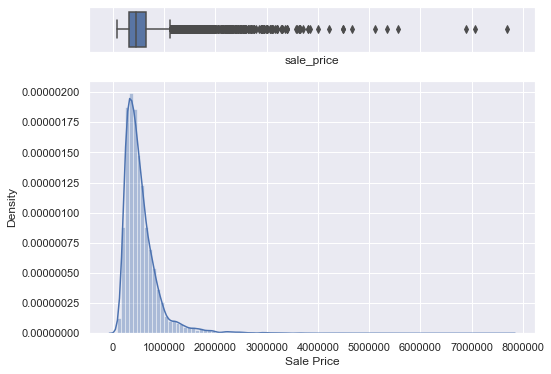

In [10]:
hist_box(df['sale_price'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
         xlabel="Sale Price", 
        )

## 2) Sale Date: 
- Cast to proper data type
- Extract year/month

In [11]:
# Convert to dt
df['sale_date'] = pd.to_datetime(df['sale_date'])

# Get month & year together
df['sale_date_monthly'] = df['sale_date'].dt.to_period('M')

# Get year
df['sale_year'] = df['sale_date'].dt.year

# Get month
df['sale_month'] = df['sale_date'].dt.month

- View stats by month

In [12]:
date_df = pd.DataFrame()
date_df['num_sales'] = df.groupby('sale_date_monthly')['sale_id'].count()
date_df['mean_sale_price'] = df.groupby('sale_date_monthly')['sale_price'].mean().astype(int)
date_df['n_days'] = df.groupby('sale_date_monthly')['sale_date'].nunique()
date_df

,num_sales,mean_sale_price,n_days
sale_date_monthly,,,
2014-05,1724,545803,30
2014-06,2126,558882,30
2014-07,2163,544584,31
2014-08,1894,536062,31
2014-09,1717,528538,30
2014-10,1831,539036,31
2014-11,1375,523796,29
2014-12,1442,525191,29
2015-01,947,526844,26


- There appears to be a positive linear relationship between the number of houses sold in a month and the mean sale price
    - There is one outlier (641), however this month has incomplete data

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


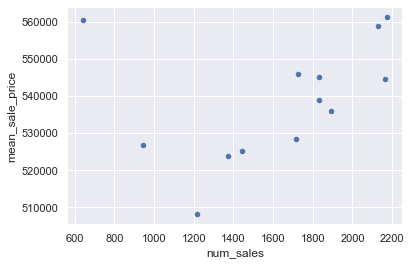

In [13]:
date_df.plot.scatter(x='num_sales',y='mean_sale_price');

- There appears to be a trend in sale price by month
    - Peak = summer
    - Trough = winter

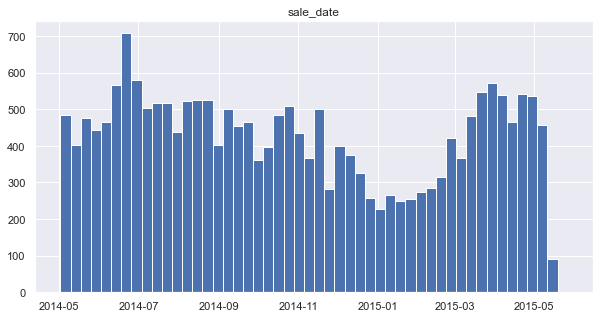

In [14]:
df.hist('sale_date', bins=50, figsize = (10,5));

- These are interesting relationships, it may be the case that:
    - The housing market has seasonality which drives up demand in the summer
    - This increased demand leads to higher sale prices
- This will be engineered as a feature in the next section!

## 5) Sqft Living: 
- Most houses have less than 4,500 sqft
- Positive Skew
- Likely needs a transform for normality

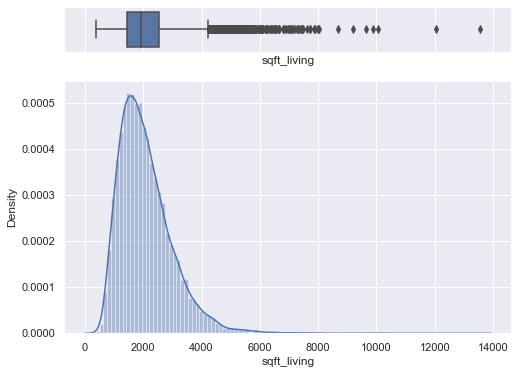

In [15]:
hist_box(df['sqft_living'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
        )

- There appears to be a positive relationship between living sqft and sale price


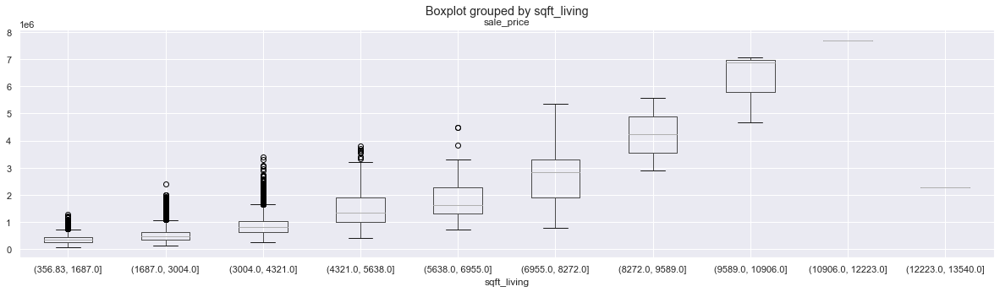

In [16]:
df_temp = df[['sale_price','sqft_living']]
df_temp['sqft_living'] = pd.cut(df['sqft_living'], bins=10)
df_temp[['sale_price','sqft_living']].boxplot('sale_price', 
                                                by='sqft_living', 
                                                figsize=(20,5)
                                                );

## 7) Waterfront: 
- Most houses are not waterfront

In [17]:
df['waterfront'].value_counts(normalize=True)

0.0000   0.9928
1.0000   0.0072
Name: waterfront, dtype: float64

- Waterfront houses do appear to have a higher sale price!

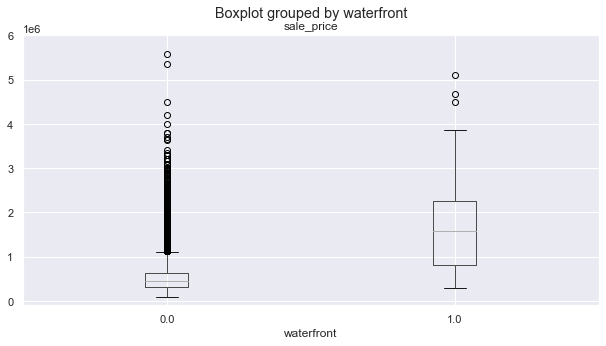

In [18]:
df[['sale_price','waterfront']].boxplot('sale_price', 
                                      by='waterfront', 
                                      figsize=(10,5)
                                     ).set_ylim(-100000,6000000);

## 8) Has Been Viewed: 
- Most houses have not been viewed at all

In [19]:
df['has_been_viewed'].value_counts(normalize=True)

0.0000   0.9021
2.0000   0.0441
3.0000   0.0235
1.0000   0.0155
4.0000   0.0148
Name: has_been_viewed, dtype: float64

- Houses that have been viewed more often times have a higher sale price
- Why?
    - This might hint at quality (higher quality houses will get viewed more)
    - This might also hint at demand (houses with multiple offers will sell for more)

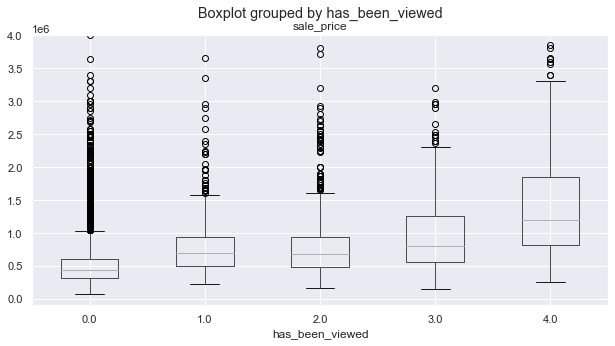

In [20]:
df[['sale_price','has_been_viewed']].boxplot('sale_price', 
                                      by='has_been_viewed', 
                                      figsize=(10,5)
                                     ).set_ylim(-100000,4000000);

## 10) Grade: 
- Most houses have a grade between 6 and 9

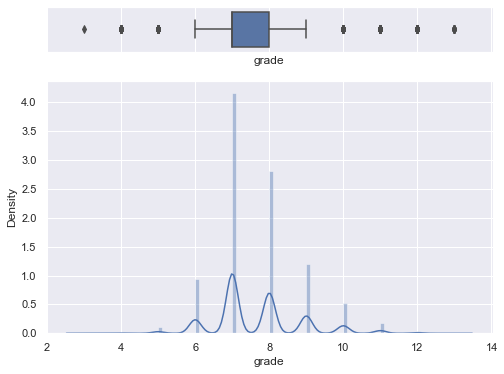

In [21]:
hist_box(df['grade'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
        )

- Grade appears to have a much stronger relationship with sale price than condition did
- It will likely have a much stronger predictive signal that condition

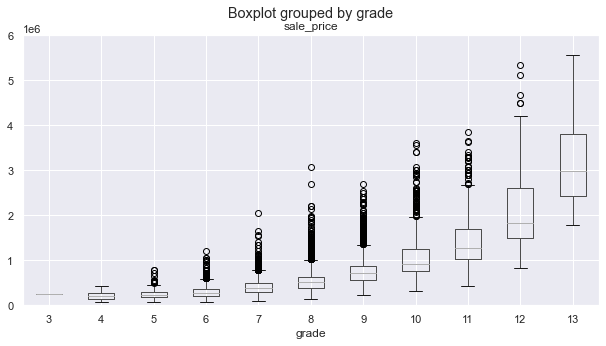

In [22]:
df[['sale_price','grade']].boxplot('sale_price', 
                                      by='grade', 
                                      figsize=(10,5)
                                     ).set_ylim(0,6000000);

## 12) Sqft Basement: 
- Most houses don't have a basement

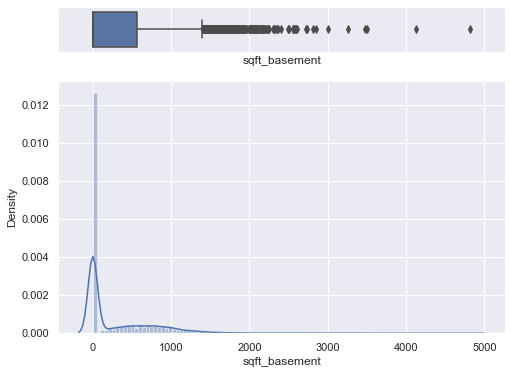

In [23]:
hist_box(df['sqft_basement'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
        )

- Houses with basements tend to have have higher sale prices

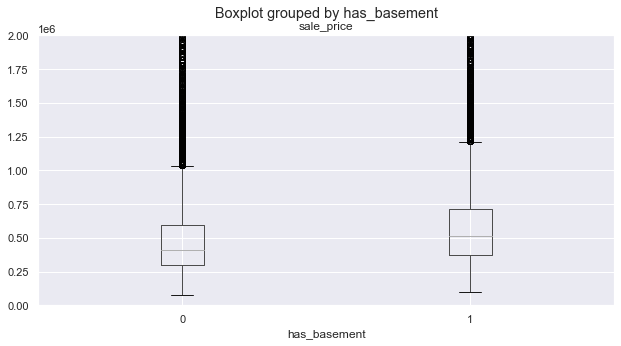

In [24]:
df_temp = df[['sale_price','sqft_basement']]
df_temp['has_basement'] = 0
df_temp.loc[df_temp['sqft_basement'] > 0, 'has_basement'] = 1
df_temp.boxplot('sale_price', 
                by='has_basement', 
                figsize=(10,5)
                ).set_ylim(-1,2000000);

- For houses that have basements, larger basements translate to higher sale prices

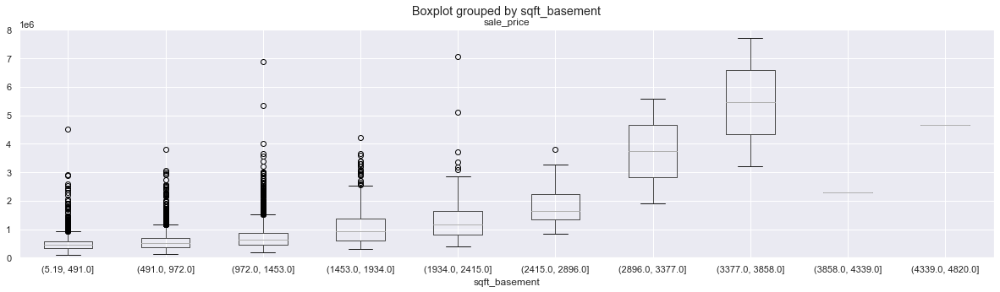

In [25]:
df_temp = df[df['sqft_basement'] > 0][['sale_price','sqft_basement']]
df_temp['sqft_basement'] = pd.cut(df_temp['sqft_basement'], bins=10)
df_temp[['sale_price','sqft_basement']].boxplot('sale_price', 
                                                by='sqft_basement', 
                                                figsize=(20,5)
                                                ).set_ylim(-1,8000000);

## 13) Year Built: 
- Most houses were built between 1960 and 2000

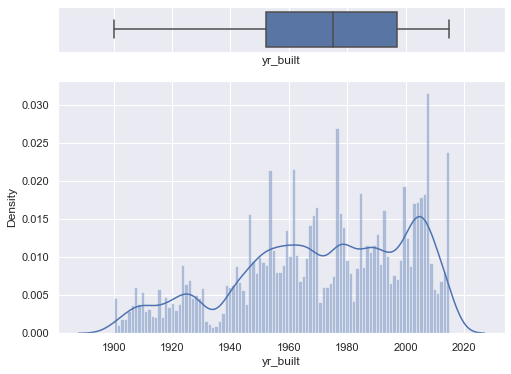

In [26]:
hist_box(df['yr_built'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
        )

- Interestingly enough, there is not a strong relationship between the year built and the sale price
- Why?
    - The newer houses being built may have other less favorable characteristics (smaller, lower grade)
    - Its also possible that the older homes (< 1920) have been remodelled, reversing the trend

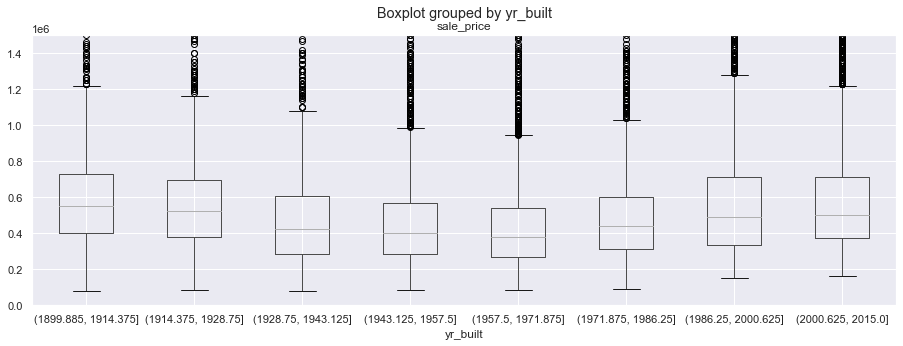

In [27]:
df_temp = df[['sale_price','yr_built']]
df_temp['yr_built'] = pd.cut(df['yr_built'], bins=8)
df_temp[['sale_price','yr_built']].boxplot('sale_price', 
                                            by='yr_built', 
                                            figsize=(15,5)
                                            ).set_ylim(-1,1500000);

## 14) Year Renovated: 
- For homes that were renovated, most were done between 1990 and 2005

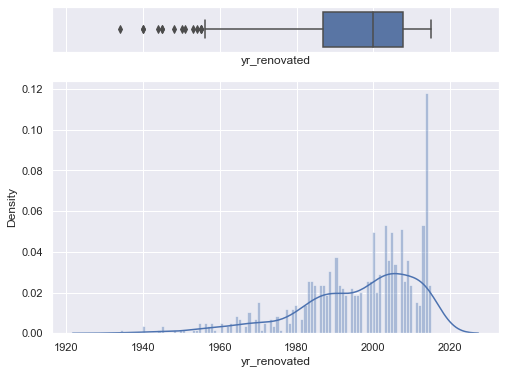

In [28]:
hist_box(df[df['yr_renovated'] > 0]['yr_renovated'], 
         figsize=(8,6), 
         bins = 100, 
         font_scale=1, 
        )

- Houses that were renovated tend to have higher sale prices

- For houses that were renovated, those that were worked on more recently tended to have higher sale prices

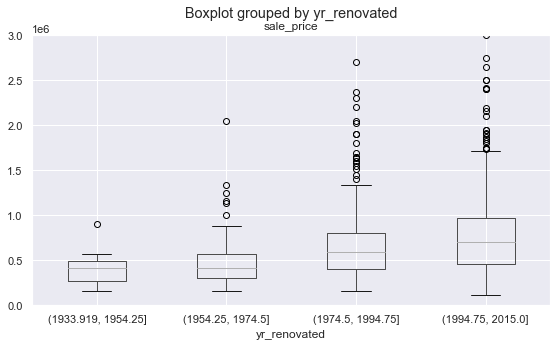

In [29]:
df_temp = df[df['yr_renovated'] > 0][['sale_price','yr_renovated']]
df_temp['yr_renovated'] = pd.cut(df_temp['yr_renovated'], bins=4)
df_temp[['sale_price','yr_renovated']].boxplot('sale_price', 
                                                by='yr_renovated', 
                                                figsize=(9,5)
                                                ).set_ylim(-1,3000000);

- Engineer features "years since last update"
    - For houses with no renovation, its the age of the house
    - For houses with a renovation, its the age of the renovation

In [30]:
df['years_since_update'] = 2022 - df['yr_built']
df.loc[df['yr_renovated'] > 0, 'years_since_update'] = 2022 - df['yr_renovated']

- Interestingly enough, the odd trend seen in year built appears here as well
    - This makes me believe there are confounding variables with houses built a long time ago (location, grade, etc)

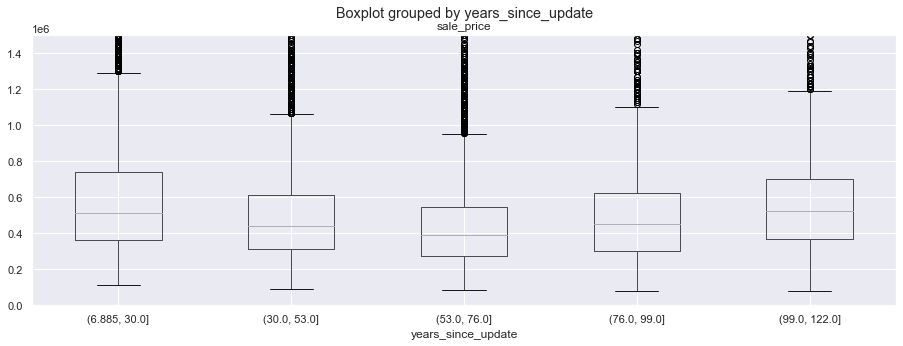

In [31]:
df_temp = df[['sale_price','years_since_update']]
df_temp['years_since_update'] = pd.cut(df_temp['years_since_update'], bins=5)
df_temp[['sale_price','years_since_update']].boxplot('sale_price', 
                                                by='years_since_update', 
                                                figsize=(15,5)
                                                ).set_ylim(-1,1500000);

- Here we see when controlling for grade, the anticipated trend does appear

## 15) Zipcode: 
- For homes that were renovated, most were done between 1990 and 2005

In [32]:
df['zipcode'].nunique()

70

- Get the number of houses and mean sale price within the zipcode
- Sort, then view every ***n*** to see if they differ meaningfully

In [33]:
zip_df = pd.DataFrame()
zip_df['num_houses'] = df.groupby('zipcode')['sale_id'].count()
zip_df['mean_sale_price'] = df.groupby('zipcode')['sale_price'].mean().astype(int)
zip_df = zip_df.sort_values('mean_sale_price', ascending=False)
zip_df.iloc[::7, :]

,num_houses,mean_sale_price
zipcode,,
98039,49,2135612
98119,176,861480
98077,196,681461
98115,565,619752
98024,78,575508
98011,191,490331
98019,188,425467
98038,571,366476
98042,540,311786


- Showing a map view of houses colored by the mean sale price in their zip
- From a map view it becomes very clear that zipcodes contain a lot of information 
    - There almost appears to be tiers of zipcodes

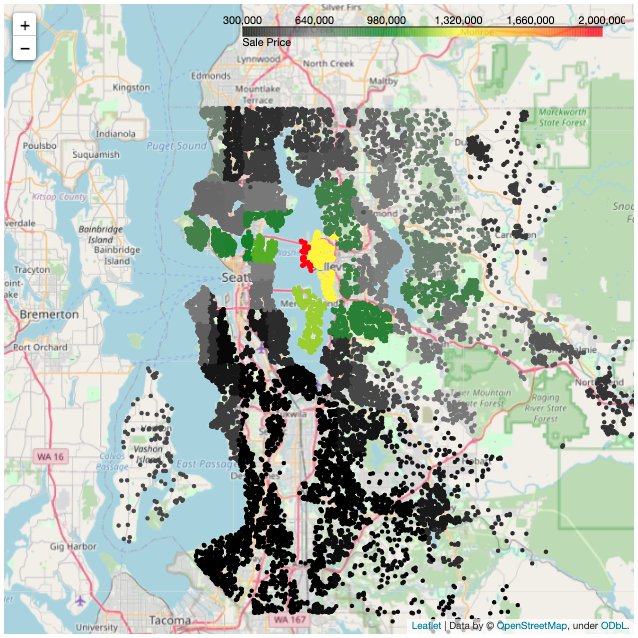

- Note:
    - Feature engineering mean sale price in zipcode must be done ***AFTER*** the test train split, as we are using the dependent variable and want to prevent data leakage

## 16) Lat/Long: 
- Location displays a strong trend with sale price!
    - Areas near Lake Washington and Bellevue have very high prices
    - Towards the south-west end of the map prices are significantly lower

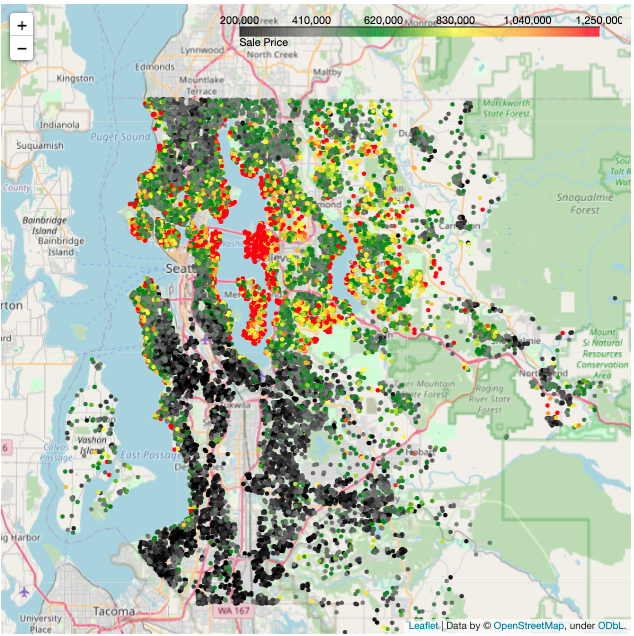

# Interactions
- Interactions refer to when the relationship between one independent variable and the dependent variable differs across a second independent variable
    - Detecting and accounting for interactions can lead to better models
- As we can see below, the relationsip between sqft_living and sale price is heavily influenced by the grade of the house

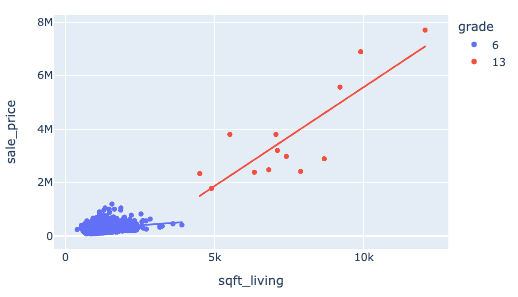

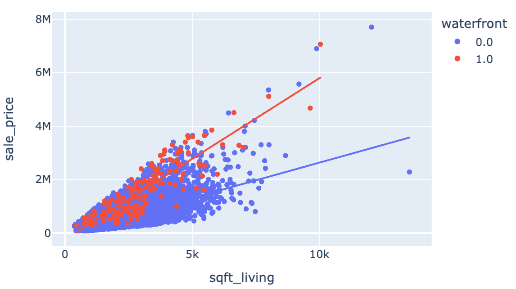

# Declare cleaned dataset for Modelling

In [41]:
# Drop unwanted columns
df_clean = df.loc[:,~df.columns.str.contains('sale_date|sale_id|yr_built')]
df_clean.sample(5)

,sale_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,has_been_viewed,condition,grade,sqft_no_basement,sqft_basement,yr_renovated,zipcode,lat,long,sqft_living_15_nn,sqft_lot_15_nn,sale_year,sale_month,years_since_update,pct_house_is_basement
unique_id,,,,,,,,,,,,,,,,,,,,,,
12699,545000.0000,4,2.2500,1890,7210,1.0000,0.0000,0.0000,3,8,1890,0.0000,0.0000,98008,47.6342,-122.1170,1920,7210,2015,4,55.0000,1890.0000
13793,325000.0000,3,1.0000,1160,9525,1.0000,0.0000,0.0000,4,7,1160,0.0000,0.0000,98077,47.7431,-122.0730,1160,10640,2014,11,54.0000,1160.0000
318,548000.0000,2,1.0000,1470,3864,1.0000,0.0000,0.0000,4,7,1170,300.0000,0.0000,98103,47.6638,-122.3450,1570,3864,2014,7,106.0000,4.8837
2342,815000.0000,4,2.2500,2000,3800,2.0000,0.0000,0.0000,3,8,2000,0.0000,0.0000,98115,47.6852,-122.3110,1610,3800,2014,5,21.0000,2000.0000
10953,283000.0000,2,1.0000,940,6350,1.0000,0.0000,0.0000,4,5,940,0.0000,0.0000,98103,47.6980,-122.3570,1490,6350,2015,4,80.0000,940.0000


## Multicollinearity
### View Correlations
- If two of our independent variables are highly correlated, the model won't be able to decipher which of them is actually influencing the dependent variable
- Its important to deal with these features so we can interpret our model properly

In [42]:
df_clean['pct_house_is_basement'] = df_clean['sqft_living'] / (df_clean['sqft_basement'] + 1)
df_clean = df_clean.drop(columns='sqft_no_basement')

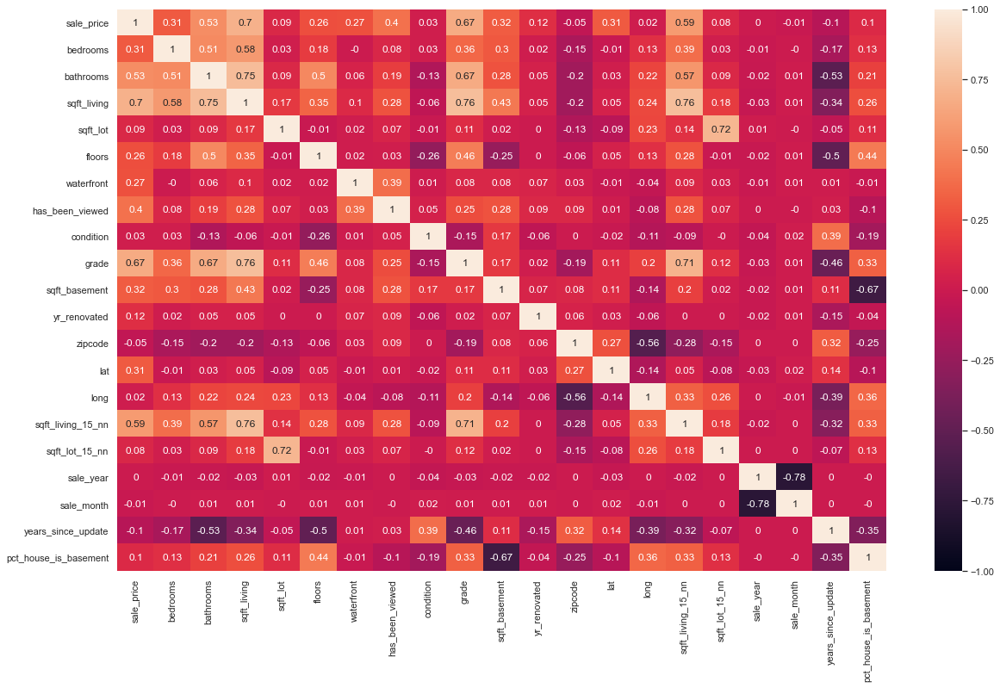

In [43]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(round(df_clean.corr(),2), vmin=-1, vmax=1, annot=True)

##### 
##### <center>-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------</center>
##### 

# <center> Modelling </center>

# Approach:
- For this sake of interpretability, Linear Regression has been chosen as the model
- Several models will be created, on for each of the following:
    - Baseline
    - Further Feature Engineering
    - Log transformed
    - Interactions

# 1) Baseline Model

In [44]:
from sklearn.linear_model import LinearRegression

In [45]:
# Define independent and dependent variables
X = df_clean.drop(columns='sale_price')
y = df_clean['sale_price']

# Perform first test/train split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

In [46]:
# Instantiate model and fit to training data
lr1 = LinearRegression()
lr1.fit(X_train, y_train)

LinearRegression()

In [47]:
# Validate Model
train_score = lr1.score(X_train, y_train)
test_score = lr1.score(X_test, y_test)
print(f'Train Score: {round(train_score,3)} \nTest Score: {round(test_score,3)}')

Train Score: 0.705 
Test Score: 0.72


In [48]:
# Get Feature Importances
feature_importances1 = pd.DataFrame(index=X_train.columns,columns=['coef'], data=lr1.coef_).sort_values('coef',ascending=False, key=lambda x: abs(x)) 

- It appears waterfront and latitude/longitude (location) dominate the importance, followed by grade (quality) and number of views (demand)

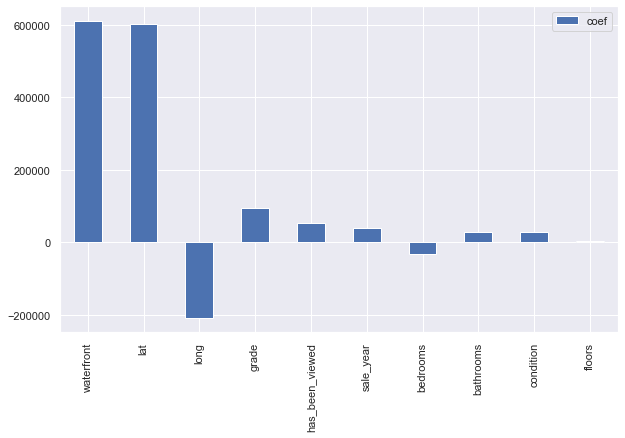

In [49]:
feature_importances1.head(10).plot.bar(figsize=(10,6));

- Our residuals are not perfectly normally distributed, as we have outlier cases in which our model greatly underpredicted the actual sale price

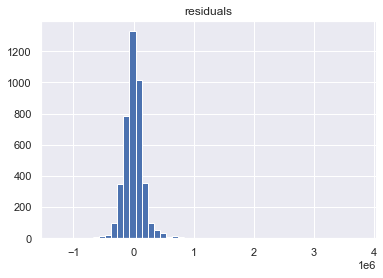

In [51]:
# Plot Residuals
pd.DataFrame({'residuals':(y_test - lr1.predict(X_test))}).hist(bins=50);

In [67]:
test_data = X_test.copy()
test_data['actual'] = y_test
test_data['prediction'] = lr1.predict(X_test)
test_data['error'] = test_data['actual'] - test_data['prediction']
test_data = test_data.sort_values('error',ascending=False,key=lambda x: abs(x))
test_data['error'].head(5)

unique_id
9245    3784934.8464
18467   1992446.6275
4145    1955726.2161
20444   1916634.5111
2083    1416731.2348
Name: error, dtype: float64

In [68]:
test_data.loc[9245,:]

bedrooms                      6.0000
bathrooms                     7.7500
sqft_living                9890.0000
sqft_lot                  31374.0000
floors                        2.0000
waterfront                    0.0000
has_been_viewed               4.0000
condition                     3.0000
grade                        13.0000
sqft_basement              1030.0000
yr_renovated                  0.0000
zipcode                   98039.0000
lat                          47.6305
long                       -122.2400
sqft_living_15_nn          4540.0000
sqft_lot_15_nn            42730.0000
sale_year                  2014.0000
sale_month                    9.0000
years_since_update           21.0000
pct_house_is_basement         9.5926
actual                  6890000.0000
prediction              3105065.1536
error                   3784934.8464
Name: 9245, dtype: float64

# 2) With Additional Feature Engineering

### Feature Engineer with Target Variable:
- Logic:
    - Split data into test and train sets
    - Calculate feature using only the training data
    - Add features to X_train and X_test

In [110]:
def split_and_engineer(cleaned_dataframe):
    '''
    Accepts dataframe
    Returns test and train splits with features engineered using target variable given the random state
    '''
    
    dep_var = 'sale_price' if 'sale_price' in cleaned_dataframe.columns else 'sale_price_log'
    
    # Define independent and dependent variables
    X = cleaned_dataframe.drop(columns=dep_var)
    y = cleaned_dataframe[dep_var]

    # Perform first test/train split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 8) 

    # Get all train data together
    train_data = cleaned_dataframe.loc[X_train.index,:]

    # Feature engineer
    train_zip_df = pd.DataFrame()
    train_zip_df['num_houses'] = train_data.groupby('zipcode')['zipcode'].count()
    
    if 'sale_price_log' in cleaned_dataframe.columns:
        cols_to_engineer = ['sale_price_log','sqft_living_log','grade_log','years_since_update_log','sqft_lot_log','condition_log','bedrooms_log']
    else:
        cols_to_engineer = ['sale_price','sqft_living','grade','years_since_update','sqft_lot','condition','bedrooms']
    
    for col in cols_to_engineer:
        train_zip_df[f'mean_{col}'] = train_data.groupby('zipcode')[col].mean()

    for col in train_zip_df.columns:
        X_train[f'{col}_in_zip'] = X_train['zipcode'].map(train_zip_df[col].to_dict())    
        X_test[f'{col}_in_zip'] = X_test['zipcode'].map(train_zip_df[col].to_dict())
    
    X_train = X_train.drop(columns='zipcode')
    X_test = X_test.drop(columns='zipcode')

    return X_train, X_test, y_train, y_test

In [96]:
X_train, X_test, y_train, y_test = split_and_engineer(df_clean)

In [97]:
lr2 = LinearRegression()
lr2.fit(X_train, y_train)

LinearRegression()

In [98]:
train_score = lr2.score(X_train, y_train)
test_score = lr2.score(X_test, y_test)
print(f'Train Score: {round(train_score,3)} \nTest Score: {round(test_score,3)}')

Train Score: 0.817 
Test Score: 0.793


In [99]:
# Get Feature Importances
feature_importances2 = pd.DataFrame(index=X_train.columns,columns=['coef'], data=lr2.coef_).sort_values('coef',ascending=False, key=lambda x: abs(x))

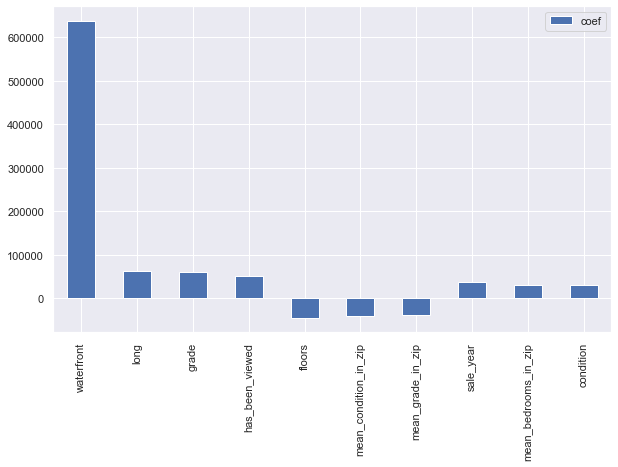

In [100]:
feature_importances2.head(10).plot.bar(figsize=(10,6));

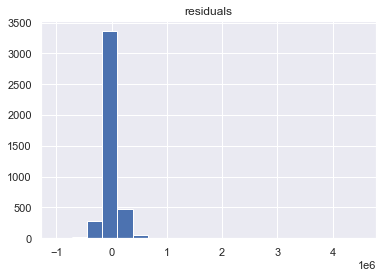

In [101]:
# Plot Residuals
pd.DataFrame({'residuals':(y_test - lr2.predict(X_test))}).hist(bins=20);

In [102]:
test_data = X_test.copy()
test_data['actual'] = y_test
test_data['prediction'] = lr2.predict(X_test)
test_data['error'] = test_data['actual'] - test_data['prediction']
test_data = test_data.sort_values('error',ascending=False,key=lambda x: abs(x))
test_data['error'].head(5)

unique_id
7245    4508964.8642
3910    3438929.7217
4407    2373090.4137
19002   1882792.1627
18467   1647040.8317
Name: error, dtype: float64

# 3) With feature normalization

### Feature Engineer with Target Variable:
- Logic:
    - Split data into test and train sets
    - Calculate feature using only the training data
    - Add features to X_train and X_test

### Log transform features for normality assumption

In [114]:
df_clean_transformed = df_clean.copy()

for col in ['sale_price','bedrooms','sqft_living','sqft_lot','condition','grade','years_since_update','sqft_living_15_nn','sqft_lot_15_nn']:
        df_clean_transformed[f'{col}_log'] = np.log10(df_clean_transformed[col])

df_clean_transformed = df_clean_transformed.drop(columns=[i for i in df_clean_transformed.columns if str(i) + '_log' in df_clean_transformed.columns])

In [115]:
X_train, X_test, y_train, y_test = split_and_engineer(df_clean_transformed)

In [116]:
lr3 = LinearRegression()
lr3.fit(X_train, y_train)

LinearRegression()

In [118]:
train_score = lr3.score(X_train, y_train)
test_score = lr3.score(X_test, y_test)
print(f'Train Score: {round(train_score,3)} \nTest Score: {round(test_score,3)}')

Train Score: 0.883 
Test Score: 0.882


In [119]:
# Get Feature Importances
feature_importances3 = pd.DataFrame(index=X_train.columns,columns=['coef'], data=lr3.coef_).sort_values('coef',ascending=False, key=lambda x: abs(x))

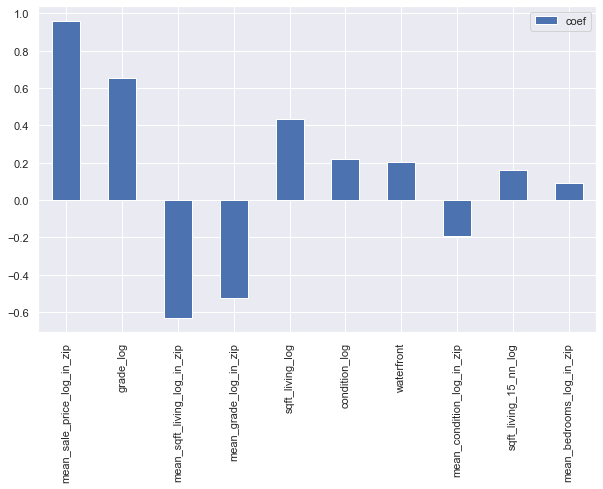

In [120]:
feature_importances3.head(10).plot.bar(figsize=(10,6));

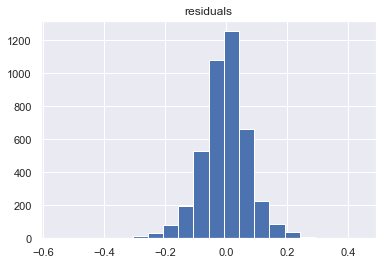

In [121]:
# Plot Residuals
pd.DataFrame({'residuals':(y_test - lr3.predict(X_test))}).hist(bins=20);

# 4) With Interactions

In [123]:
X_train, X_test, y_train, y_test = split_and_engineer(df_clean_transformed)

In [124]:
cols_to_include = X_train.columns

for i1, col1 in enumerate(cols_to_include):
    for col2 in cols_to_include[i1+1:]:
        X_train[f'{col1}_x_{col2}'] = X_train[col1] * X_train[col2]
        X_test[f'{col1}_x_{col2}'] = X_test[col1] * X_test[col2]

In [125]:
lr4 = LinearRegression()
lr4.fit(X_train, y_train)

LinearRegression()

In [126]:
train_score = lr4.score(X_train, y_train)
test_score = lr4.score(X_test, y_test)
print(f'Train Score: {round(train_score,3)} \nTest Score: {round(test_score,3)}')

Train Score: 0.902 
Test Score: 0.892


In [127]:
# Get Feature Importances
feature_importances4 = pd.DataFrame(index=X_train.columns,columns=['coef'], data=lr4.coef_).sort_values('coef',ascending=False, key=lambda x: abs(x))

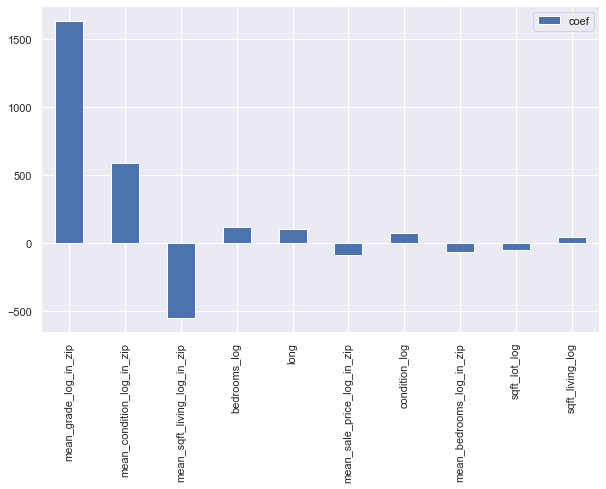

In [128]:
feature_importances4.head(10).plot.bar(figsize=(10,6));

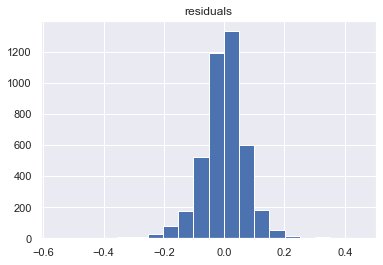

In [129]:
# Plot Residuals
pd.DataFrame({'residuals':(y_test - lr4.predict(X_test))}).hist(bins=20);

##### 
##### <center>-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------</center>
##### 

##### 
##### <center>-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------</center>
##### 

### Re-create "best" model calculate predictions, actuals, residuals

In [132]:
comparison_df = X_train.copy()
comparison_df['Prediction'] = lr4.predict(comparison_df)
comparison_df['Actual'] = y_train
comparison_df['Residual'] = comparison_df['Prediction'] - comparison_df['Actual']

In [133]:
comparison_df

,bathrooms,floors,waterfront,has_been_viewed,sqft_basement,yr_renovated,lat,long,sale_year,sale_month,pct_house_is_basement,bedrooms_log,sqft_living_log,sqft_lot_log,condition_log,grade_log,years_since_update_log,sqft_living_15_nn_log,sqft_lot_15_nn_log,num_houses_in_zip,mean_sale_price_log_in_zip,mean_sqft_living_log_in_zip,mean_grade_log_in_zip,mean_years_since_update_log_in_zip,mean_sqft_lot_log_in_zip,mean_condition_log_in_zip,mean_bedrooms_log_in_zip,bathrooms_x_floors,bathrooms_x_waterfront,bathrooms_x_has_been_viewed,bathrooms_x_sqft_basement,bathrooms_x_yr_renovated,bathrooms_x_lat,bathrooms_x_long,bathrooms_x_sale_year,bathrooms_x_sale_month,bathrooms_x_pct_house_is_basement,bathrooms_x_bedrooms_log,bathrooms_x_sqft_living_log,bathrooms_x_sqft_lot_log,bathrooms_x_condition_log,bathrooms_x_grade_log,bathrooms_x_years_since_update_log,bathrooms_x_sqft_living_15_nn_log,bathrooms_x_sqft_lot_15_nn_log,bathrooms_x_num_houses_in_zip,bathrooms_x_mean_sale_price_log_in_zip,bathrooms_x_mean_sqft_living_log_in_zip,bathrooms_x_mean_grade_log_in_zip,bathrooms_x_mean_years_since_update_log_in_zip,bathrooms_x_mean_sqft_lot_log_in_zip,bathrooms_x_mean_condition_log_in_zip,bathrooms_x_mean_bedrooms_log_in_zip,floors_x_waterfront,floors_x_has_been_viewed,floors_x_sqft_basement,floors_x_yr_renovated,floors_x_lat,floors_x_long,floors_x_sale_year,floors_x_sale_month,floors_x_pct_house_is_basement,floors_x_bedrooms_log,floors_x_sqft_living_log,floors_x_sqft_lot_log,floors_x_condition_log,floors_x_grade_log,floors_x_years_since_update_log,floors_x_sqft_living_15_nn_log,floors_x_sqft_lot_15_nn_log,floors_x_num_houses_in_zip,floors_x_mean_sale_price_log_in_zip,floors_x_mean_sqft_living_log_in_zip,floors_x_mean_grade_log_in_zip,floors_x_mean_years_since_update_log_in_zip,floors_x_mean_sqft_lot_log_in_zip,floors_x_mean_condition_log_in_zip,floors_x_mean_bedrooms_log_in_zip,waterfront_x_has_been_viewed,waterfront_x_sqft_basement,waterfront_x_yr_renovated,waterfront_x_lat,waterfront_x_long,waterfront_x_sale_year,waterfront_x_sale_month,waterfront_x_pct_house_is_basement,waterfront_x_bedrooms_log,waterfront_x_sqft_living_log,waterfront_x_sqft_lot_log,waterfront_x_condition_log,waterfront_x_grade_log,waterfront_x_years_since_update_log,waterfront_x_sqft_living_15_nn_log,waterfront_x_sqft_lot_15_nn_log,waterfront_x_num_houses_in_zip,waterfront_x_mean_sale_price_log_in_zip,waterfront_x_mean_sqft_living_log_in_zip,waterfront_x_mean_grade_log_in_zip,waterfront_x_mean_years_since_update_log_in_zip,waterfront_x_mean_sqft_lot_log_in_zip,waterfront_x_mean_condition_log_in_zip,waterfront_x_mean_bedrooms_log_in_zip,has_been_viewed_x_sqft_basement,has_been_viewed_x_yr_renovated,has_been_viewed_x_lat,has_been_viewed_x_long,has_been_viewed_x_sale_year,has_been_viewed_x_sale_month,has_been_viewed_x_pct_house_is_basement,has_been_viewed_x_bedrooms_log,has_been_viewed_x_sqft_living_log,has_been_viewed_x_sqft_lot_log,has_been_viewed_x_condition_log,has_been_viewed_x_grade_log,has_been_viewed_x_years_since_update_log,has_been_viewed_x_sqft_living_15_nn_log,has_been_viewed_x_sqft_lot_15_nn_log,has_been_viewed_x_num_houses_in_zip,has_been_viewed_x_mean_sale_price_log_in_zip,has_been_viewed_x_mean_sqft_living_log_in_zip,has_been_viewed_x_mean_grade_log_in_zip,has_been_viewed_x_mean_years_since_update_log_in_zip,has_been_viewed_x_mean_sqft_lot_log_in_zip,has_been_viewed_x_mean_condition_log_in_zip,has_been_viewed_x_mean_bedrooms_log_in_zip,sqft_basement_x_yr_renovated,sqft_basement_x_lat,sqft_basement_x_long,sqft_basement_x_sale_year,sqft_basement_x_sale_month,sqft_basement_x_pct_house_is_basement,sqft_basement_x_bedrooms_log,sqft_basement_x_sqft_living_log,sqft_basement_x_sqft_lot_log,sqft_basement_x_condition_log,sqft_basement_x_grade_log,sqft_basement_x_years_since_update_log,sqft_basement_x_sqft_living_15_nn_log,sqft_basement_x_sqft_lot_15_nn_log,sqft_basement_x_num_houses_in_zip,sqft_basement_x_mean_sale_price_log_in_zip,sqft_basement_x_mean_sqft_living_log_in_zip,

### Plot predictions vs actuals

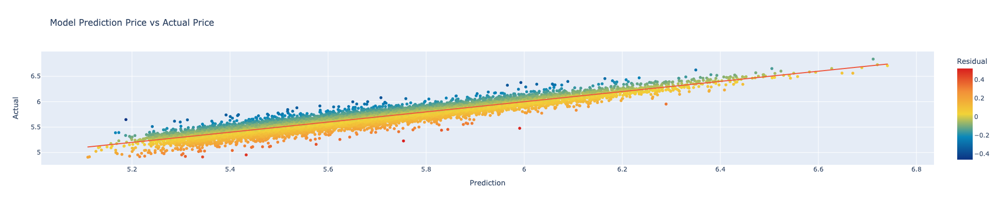

In [134]:
fig = px.scatter(comparison_df, 
                 x='Prediction', 
                 y='Actual', 
                 trendline="ols",
                 color='Residual',
                 color_continuous_scale='portland',
                 title='Model Prediction Price vs Actual Price',
                 height = 400,
                 width = 700
                )
fig.show()

### Map Residuals

In [ ]:
# Create map
map_visual = folium.Map(location=(comparison_df['lat'].mean(), comparison_df['long'].mean()), zoom_star = 9, width = 500, height = 500)

# Specify feature to color by
color_by = 'Residual'

# Create color map
colormap = cm.LinearColormap(colors=['green','blue','black','red','yellow'], vmin=-1300000, vmax= 750000)

# Loop through each home in set, create circle, add to map.
for idx in comparison_df.index:
    folium.Circle(
        location=[comparison_df.loc[idx]['lat'], comparison_df.loc[idx]['long']],
        radius = 100,
        fill=True,
        color = colormap(comparison_df.loc[idx][color_by]),
    
    ).add_to(map_visual)
    
# Add colorbar
colormap.caption = 'Sale Price'
map_visual.add_child(colormap)

# View
map_visual